In [1]:
import numpy as np
import pandas as pd

# For object detection
import cv2
import cvlib
from cvlib.object_detection import draw_bbox

# For plotting
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# For data profiling
import pandas as pd
from pandas_profiling import ProfileReport

In [2]:
# utils for visualization   
tableau20 = [(31, 119, 180), (174, 199, 232), (255, 127, 14), (255, 187, 120),    
             (44, 160, 44), (152, 223, 138), (214, 39, 40), (255, 152, 150),    
             (148, 103, 189), (197, 176, 213), (140, 86, 75), (196, 156, 148),    
             (227, 119, 194), (247, 182, 210), (127, 127, 127), (199, 199, 199),    
             (188, 189, 34), (219, 219, 141), (23, 190, 207), (158, 218, 229)]  

# Scale the RGB values to the [0, 1] range, which is the format matplotlib accepts.    
for i in range(len(tableau20)):    
    r, g, b = tableau20[i]    
    tableau20[i] = (r / 255., g / 255., b / 255.)  

cwd = "../data/"
dir_cam1 = "../data/dssg_jpg_1/" # 104 Ave And 140 St, station name: enc_104_140_cam1
stname_cam1 = "enc_104_140_cam1"
dir_cam2 = "../data/dssg_jpg_2/" # 104 Ave And City Hall Driveway, station name: enc_104egress_cityhall_cam1
stname_cam2 = "enc_104egress_cityhall_cam1"
dir_cam1_24h = "../data/dssg_may_3_2021_rolling_window/" # 104 Ave And 140 St, May 2nd - 3rd

df_desc = pd.read_csv(cwd + 'Surrey_desc.csv')

In [3]:
def draw_detection(img, model, conf, nms, write_conf=False, resize=False):
    test_im = cv2.imread(img)
    if resize: 
        height, width = test_im.shape[:2]
        test_im = cv2.resize(test_im,(2*width, 2*height), interpolation = cv2.INTER_CUBIC)
    print("Using model: " + model)
    bbox, label, conf = cvlib.detect_common_objects(test_im, model=model, confidence=conf, nms_thresh=nms)
    # Confidence score could be returned here
    output_image = draw_bbox(test_im, bbox, label, conf, write_conf=write_conf)
    return output_image

def analyze_pic(filename, dir_cam, df, conf=0.5, nms=0.5, write_conf=False, model = 'yolov3', count_from_csv=False, verbose=False, resize=False):
    '''
    Parameters:
    -----------
        filename: str
            filename of images
        dir_cam: str
            directory of camera images for search for filename
        df: pd.dataframe
            dataset with extracted count 
        conf: 0..1
            confidence threshold
        nms: 0..1
            NMS thershold
        write_conf: bool, optional
            write confidence score. Default: False
        model: str, optional
            Supported models: yolov3, yolov3-tiny, yolov4, yolov4-tiny. Default: yolov4
        resize: bool, optional
            upscale resolution with interpolation. Default: False 
    '''
    
    # Display image with bounding boxes
    boxes = draw_detection(dir_cam + filename, model, conf, nms, write_conf, resize)
    fig = plt.gcf()
    fig.set_size_inches(18, 10)
    plt.axis("off")
    plt.imshow(boxes[...,::-1])
    
    # Extract count from csv
    print(filename)
    if filename not in df['filename'].values:
        print("Record does not exist in the database!")
        count_from_csv = False
    if count_from_csv:
        counts = df[df['filename'] == filename]
        plt.text(1.05, 0.3,
             "\
             Counts from csv:\n \
             Car: %d \n \
             Truck: %d \n \
             Bus: %d \n \
             Motorcycle: %d \n \
             Bicycle: %d \n \
             Vehicle in total: %d \n \
             Person: %d" \
                 %
                 (counts['car_count'],counts['truck_count'],counts['bus_count'], \
                  counts['motorcycle_count'],counts['bicycle_count'],counts['vehicle_count'], counts['person_count']),
             transform=plt.gca().transAxes)
    
    plt.show()

## Dec 2020 hourly data 341 stations

### Dataset Description

In [4]:
variables = ['bicycle', 'bus', 'car', 'motorcycle', 'truck', 'person']
count_types = ['bicycle_count', 'bus_count', 'car_count', 'motorcycle_count', 'truck_count', 'person_count']

In [5]:
# Load the main dataset
df_dec2020 = pd.read_csv(cwd + 'Surrey_data.csv')

# Convert timezone
df_dec2020['time'] = pd.to_datetime(df_dec2020['time'],  infer_datetime_format=True, utc=True)
df_dec2020['time'] = df_dec2020['time'].dt.tz_convert('America/Vancouver')

# Add column for total amount of vehicles for quick visualization
df_dec2020['vehicle_count'] = df_dec2020['bicycle_count'] + df_dec2020['bus_count'] + df_dec2020['car_count'] + df_dec2020['motorcycle_count'] + df_dec2020['truck_count']

# Sort based on time and station
df_dec2020.sort_values(['station'], inplace=True)

In [6]:
# Data profile
profile_dec2020 = ProfileReport(df_dec2020, title="Pandas Profiling Report", explorative=True)
profile_dec2020

Summarize dataset:   0%|          | 0/31 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
profile_dec2020.to_file(output_file="profile_dec2020_Surrey_data.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
# Clean unused columns
df_dec2020.drop(['s3url', 'year', 'month', 'day', 'date'], axis=1, inplace=True)

### Distribution Visualization

<AxesSubplot:>

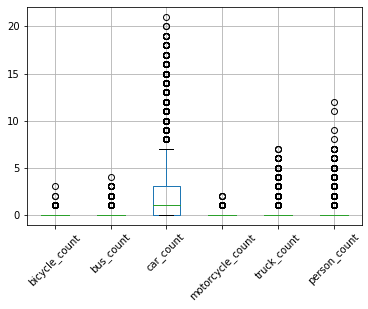

In [9]:
%matplotlib inline
df_dec2020.boxplot(count_types, rot=45, labels=variables)

In [ ]:
# TODO: Produce pie chart
%matplotlib inline
# pie_df = pd.DataFrame({'total': [df_dec2020.sum(axis=1)[count_type] for count_type in count_types]},
                       index=variables)
# pie_df.plot.pie(y='total')

### Count extracted vs. Image Examples
Image dataset is from camera station enc_104_140_cam1

Using model: yolov3
2020-12-01-16-22-43-enc_104_140_cam1.jpg


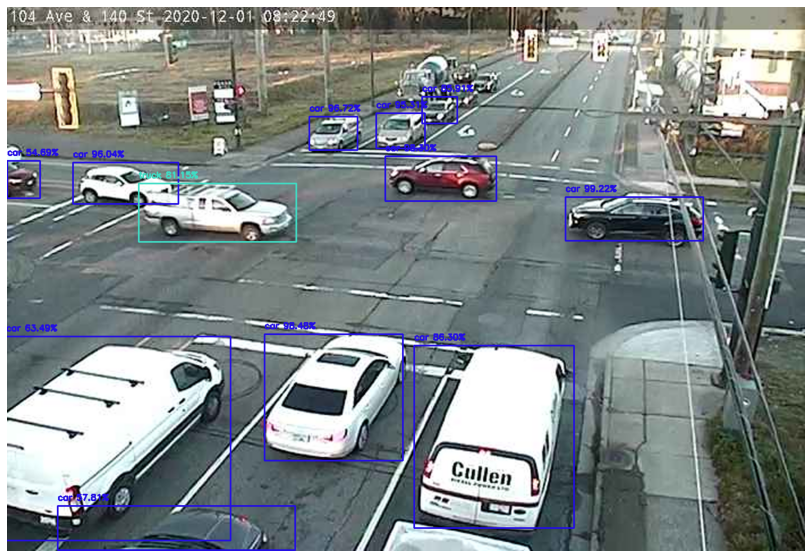

In [12]:
analyze_pic('2020-12-01-16-22-43-enc_104_140_cam1.jpg', dir_cam=dir_cam1, df=df_dec2020, write_conf=True, resize=True)

Using model: yolov3
2020-12-01-16-22-43-enc_104_140_cam1.jpg


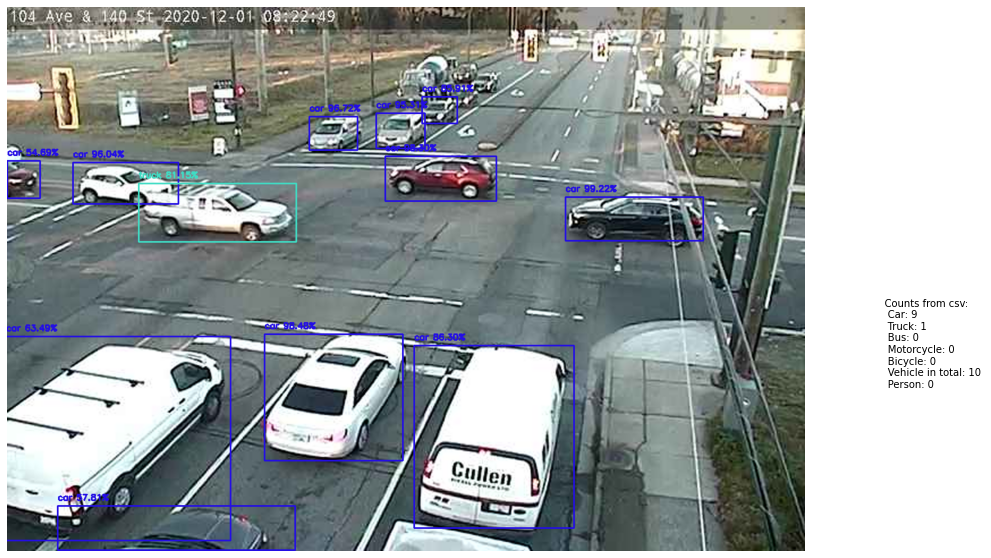

In [13]:
# With confidence and comparison from detected count dataset
analyze_pic('2020-12-01-16-22-43-enc_104_140_cam1.jpg', dir_cam=dir_cam1, df=df_dec2020, resize=True, write_conf=True, count_from_csv=True)

Using model: yolov3
2020-12-01-16-22-43-enc_104_140_cam1.jpg


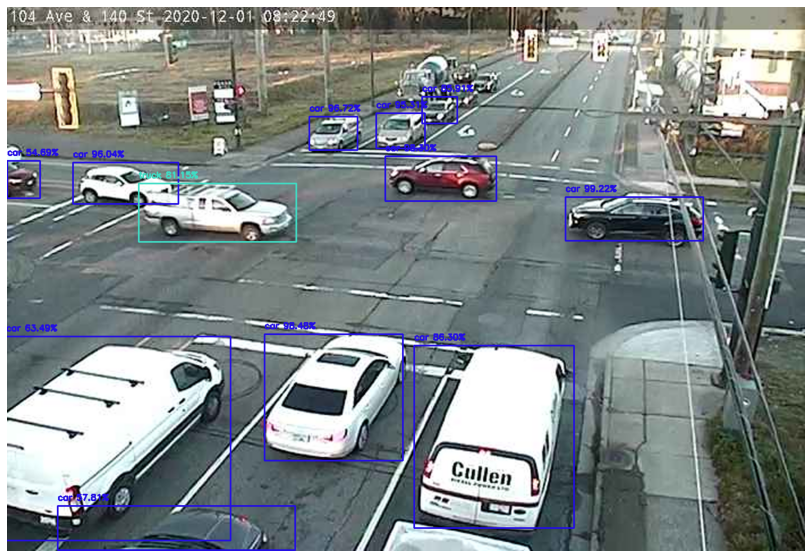

In [14]:
# Test with difference confidence threshold and nms threshold
analyze_pic('2020-12-01-16-22-43-enc_104_140_cam1.jpg', dir_cam=dir_cam1, df=df_dec2020, conf=0.4, nms=0.5, resize=True, write_conf=True)

## Undercounting Issue in the Vehicle Detection

Current pipeline uses `detect_common_object()` function from cvlib. The version used to generated the dataset so far in the server uses **YOLOv3** model pretrained on COCO dataset capable of detecting 80 common objects in context.

### Issue 1: Crowd detection

*Problem:*
- High occulusion & low resolution: when vehicles line up at the intersection, they overlaps heavily with each other. Current pipeline fails to detect the semantic features when they interweave, thus is missing count at far distance when there is a long line-up. On the other hand, it is able to detect the vehicles correctly at far distance. the when the line is moving (the cars are more apart).

*Result:*
- **Saturation**: the maximum vehicle count at the example intersection is almost *capped at around 15* where one can easily find snapshot with 20+ cars under visual check.
- **Random noise**: when the road is busy, the vehicle counts shows obvious fluctations as line-up resulting from red light could appear out-of-sync from the snapshot frequency.

*Example:*

1. Low **detected count** does not necessarily mean low traffic. In the below examples, the entire queue incoming is hardly captured.

Using model: yolov3
2020-12-04-17-22-42-enc_104_140_cam1.jpg


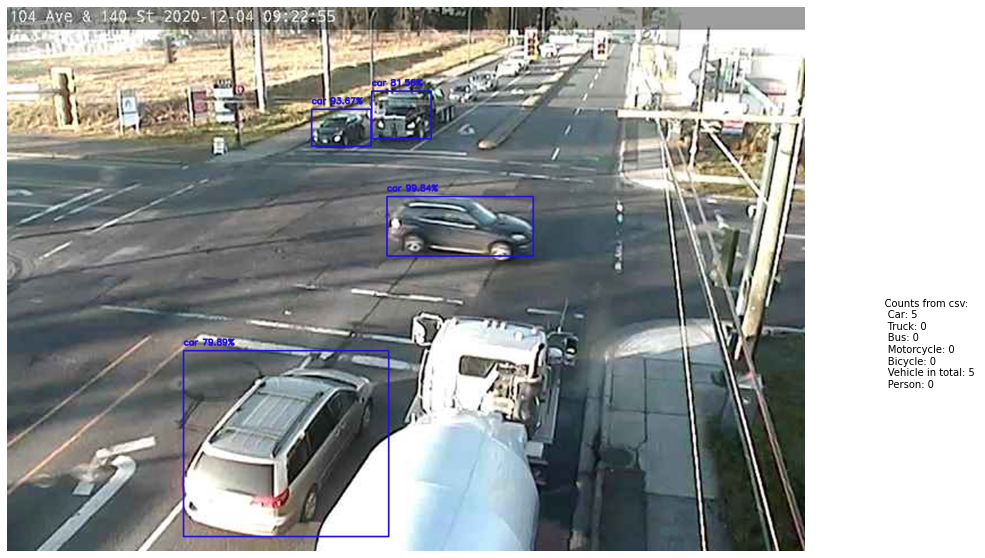

Using model: yolov3
2020-12-04-23-22-42-enc_104_140_cam1.jpg


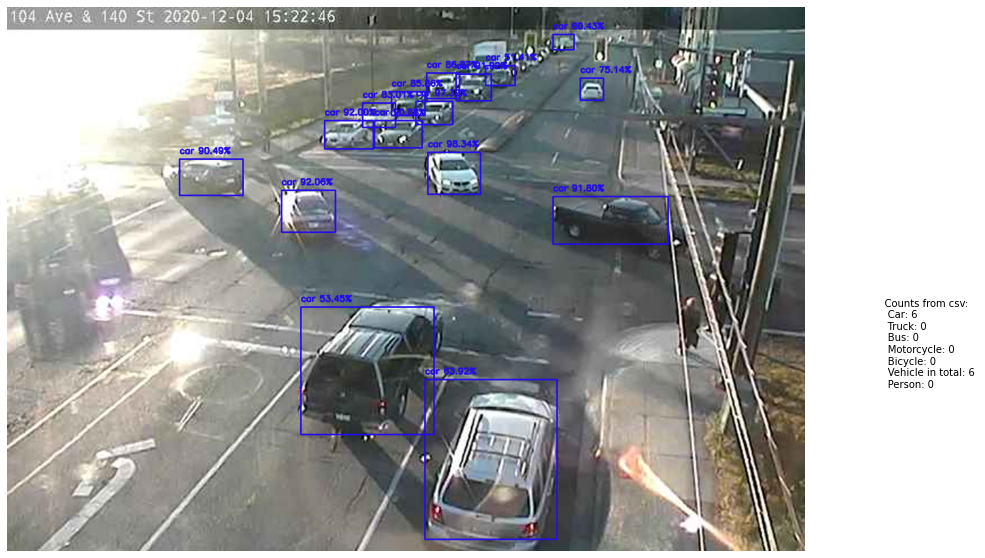

In [15]:
analyze_pic("2020-12-04-17-22-42-enc_104_140_cam1.jpg", dir_cam=dir_cam1, df=df_dec2020, resize=True, write_conf=True, count_from_csv=True)
analyze_pic("2020-12-04-23-22-42-enc_104_140_cam1.jpg", dir_cam=dir_cam1, df=df_dec2020, resize=True, write_conf=True, count_from_csv=True)

2. When switching between free-of-flow (**F**) and queue (**Q**) traffic state, the undercounting issue occurs inconsistently. The top image should count more cars than the bottom one while the detected count captures the opposite.

Using model: yolov3
2020-12-04-23-22-42-enc_104_140_cam1.jpg


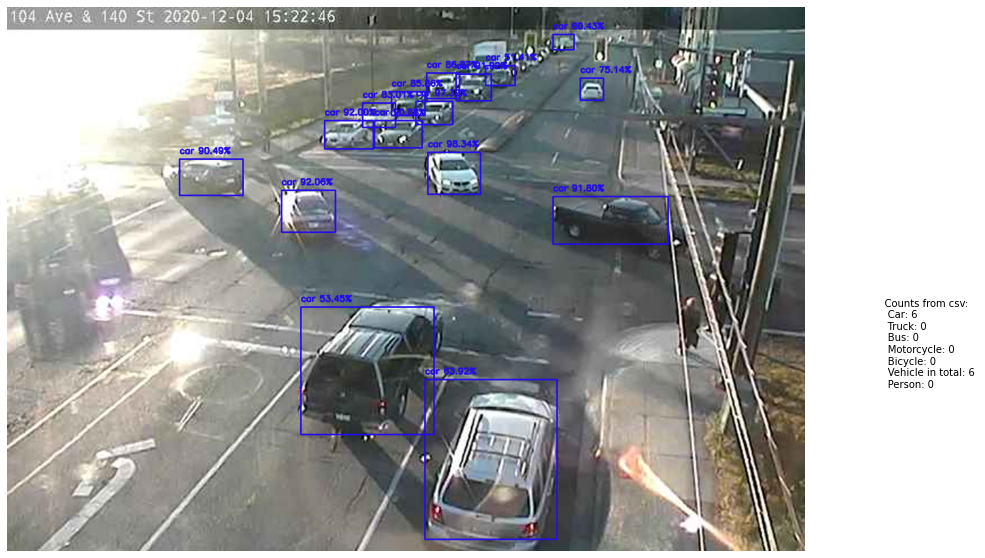

Using model: yolov3
2020-12-02-23-22-43-enc_104_140_cam1.jpg


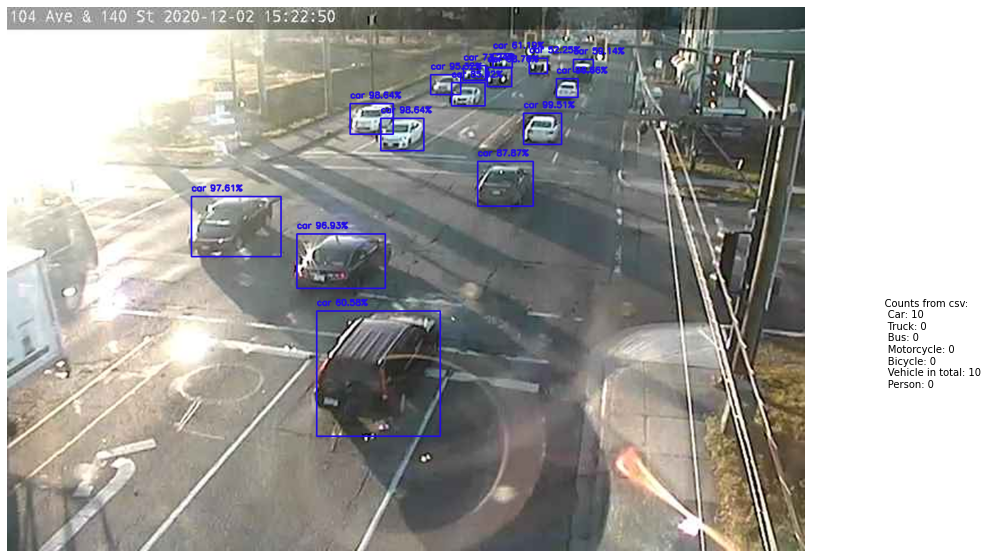

In [16]:
analyze_pic("2020-12-04-23-22-42-enc_104_140_cam1.jpg", dir_cam=dir_cam1, df=df_dec2020, resize=True, write_conf=True, count_from_csv=True)
analyze_pic("2020-12-02-23-22-43-enc_104_140_cam1.jpg", dir_cam=dir_cam1, df=df_dec2020, resize=True, write_conf=True, count_from_csv=True)

3. Unstability in the algorithm itself

Using model: yolov3
2020-12-06-23-22-42-enc_104_140_cam1.jpg


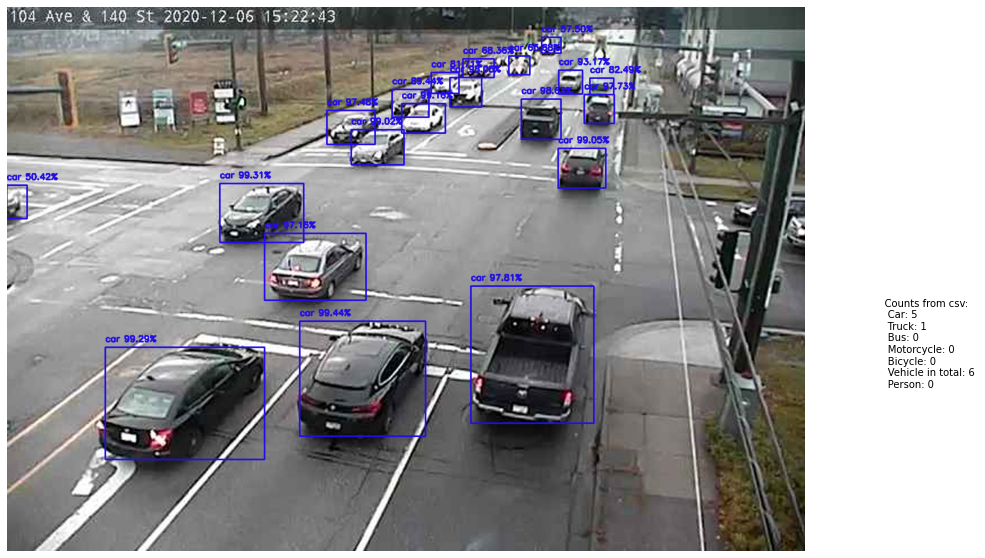

Using model: yolov3
2020-12-02-23-22-43-enc_104_140_cam1.jpg


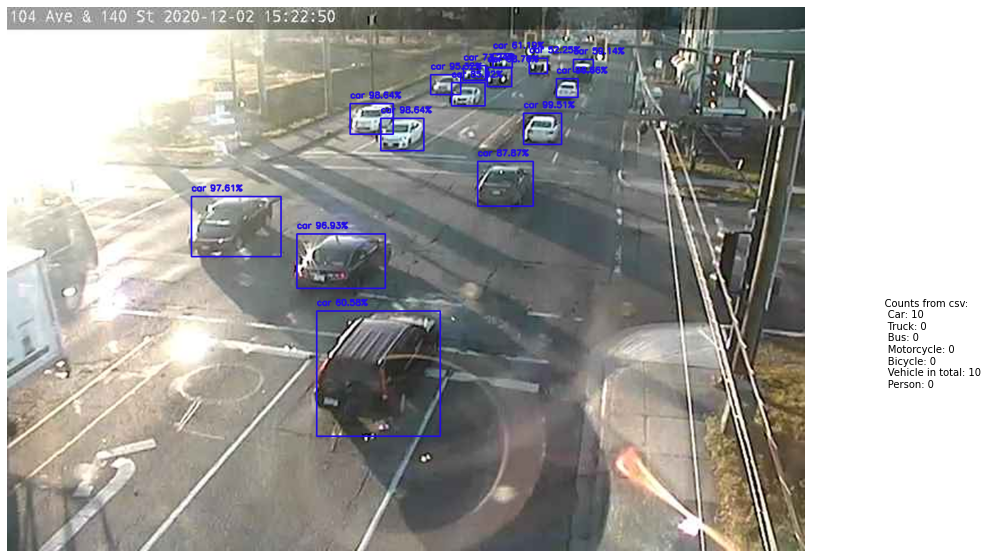

In [17]:
analyze_pic("2020-12-06-23-22-42-enc_104_140_cam1.jpg", dir_cam=dir_cam1, df=df_dec2020, resize=True, write_conf=True, count_from_csv=True)
analyze_pic("2020-12-02-23-22-43-enc_104_140_cam1.jpg", dir_cam=dir_cam1, df=df_dec2020, resize=True, write_conf=True, count_from_csv=True)

### Issue 2: Nighttime Vehicle Detection

The current pipeline does not distinguish between nighttime and daytime snapshots.
Nighttime detection presents larger bias, as the detection does not work welll with **traffic lights** and **vehicle headlights**.

Using model: yolov3
2020-12-06-23-22-42-enc_104_140_cam1.jpg


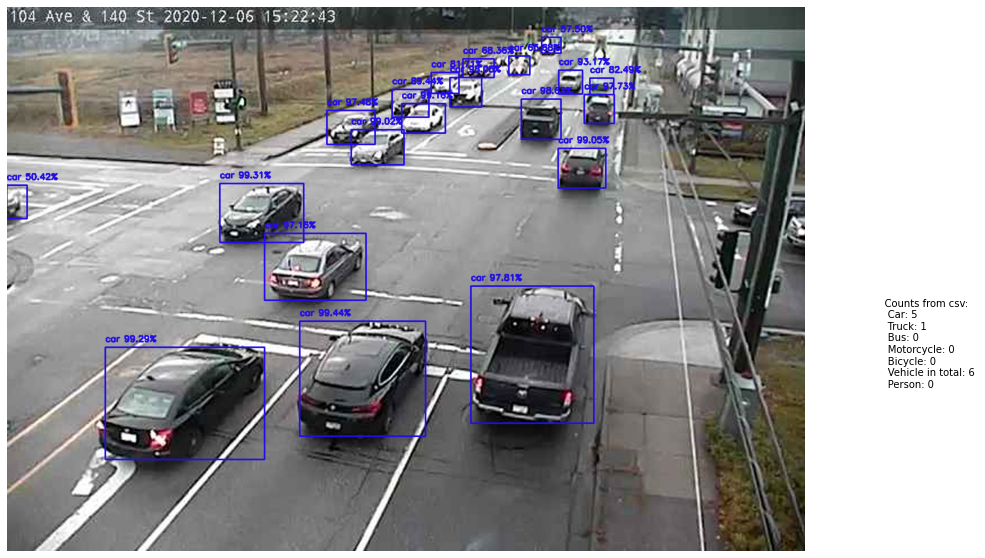

In [18]:
analyze_pic("2020-12-06-23-22-42-enc_104_140_cam1.jpg", dir_cam=dir_cam1, df=df_dec2020, resize=True, write_conf=True, count_from_csv=True)

Using model: yolov3
2020-12-03-01-22-42-enc_104_140_cam1.jpg


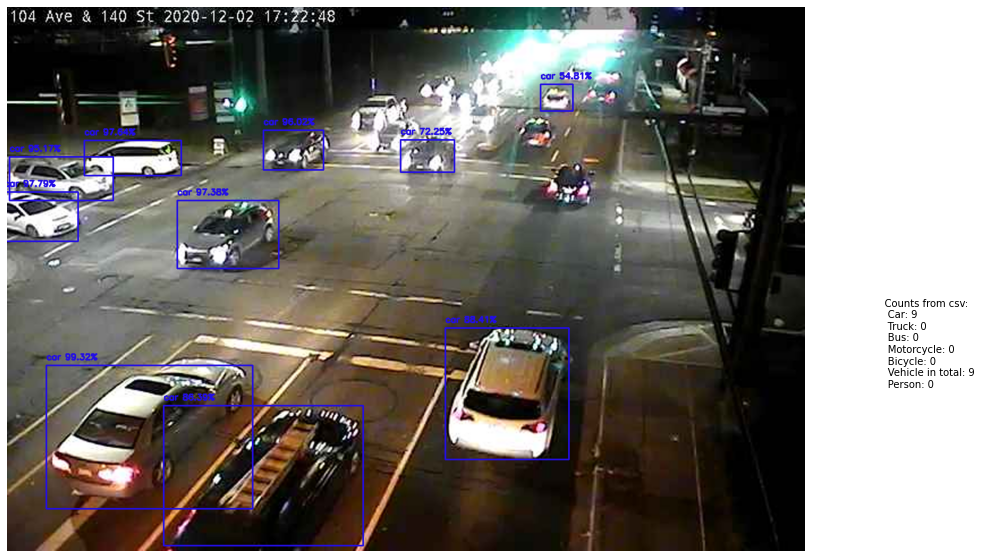

Using model: yolov3
2020-12-05-01-22-42-enc_104_140_cam1.jpg


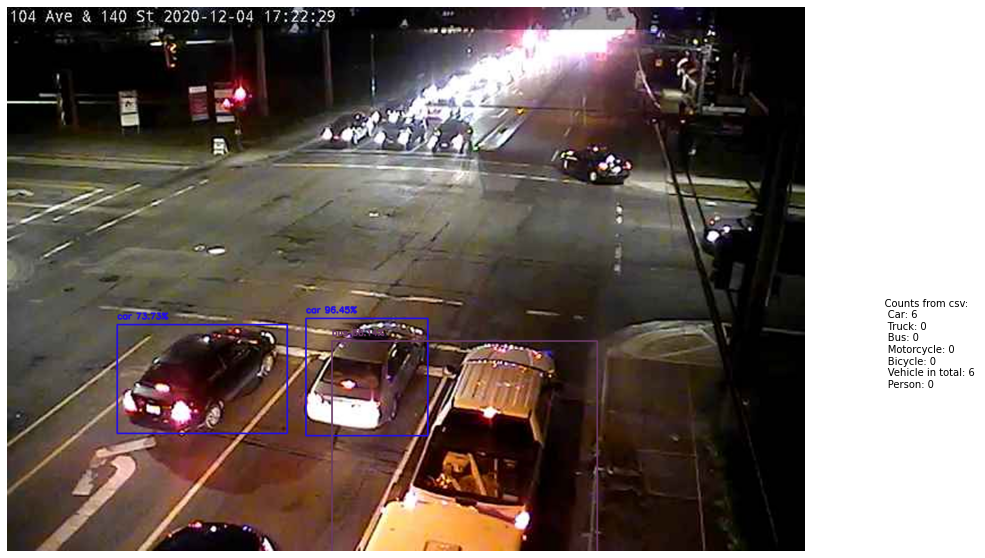

In [19]:
analyze_pic("2020-12-03-01-22-42-enc_104_140_cam1.jpg", dir_cam=dir_cam1, df=df_dec2020, resize=True, write_conf=True, count_from_csv=True)
analyze_pic("2020-12-05-01-22-42-enc_104_140_cam1.jpg", dir_cam=dir_cam1, df=df_dec2020, resize=True, write_conf=True, count_from_csv=True)

## Camera Metadata: Roadtypes/Facing/Height

Intersections would have more vehicles (from different directions and accumulated due to traffic stop) compared to one-way street.

The height and angle of camera also affects FOV and thus how many cars it can capture.

Using model: yolov3
2020-12-03-01-22-42-enc_104_140_cam1.jpg


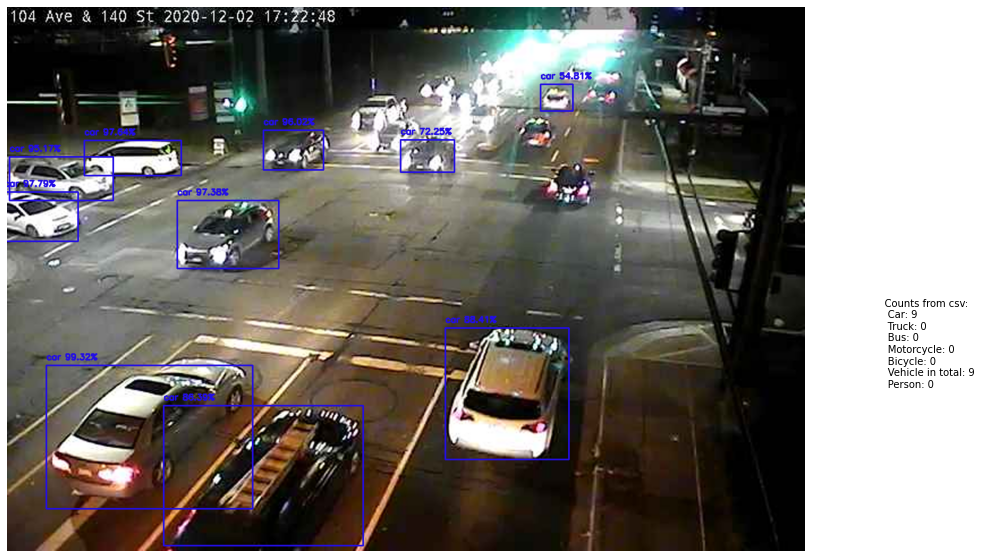

Using model: yolov3
2020-12-21-20-22-42-enc_104egress_cityhall_cam1.jpg


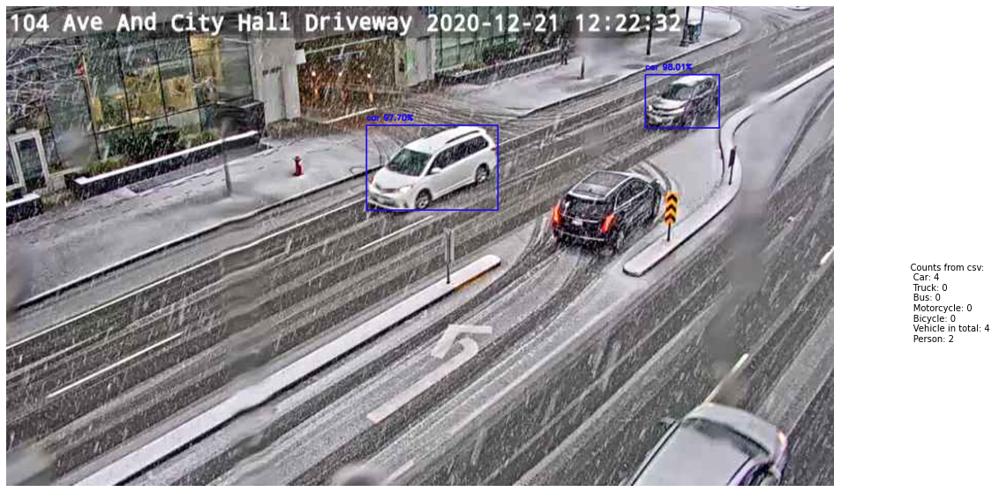

In [20]:
analyze_pic("2020-12-03-01-22-42-enc_104_140_cam1.jpg", dir_cam=dir_cam1, df=df_dec2020, resize=True, write_conf=True, count_from_csv=True)
analyze_pic("2020-12-21-20-22-42-enc_104egress_cityhall_cam1.jpg", dir_cam=dir_cam2, df=df_dec2020, resize=True, write_conf=True, count_from_csv=True)

## Corrupted Image

> Dave: Compromised data can be a result of server or IO failure during the acquisition process. Luckily our server log indicates a very low fail rate especially for these Canadian assets. 

So not too much an issue. Only see ~2 in 1487 records across the two camera datasets.

Using model: yolov3
2020-12-05-18-22-43-enc_104egress_cityhall_cam1.jpg


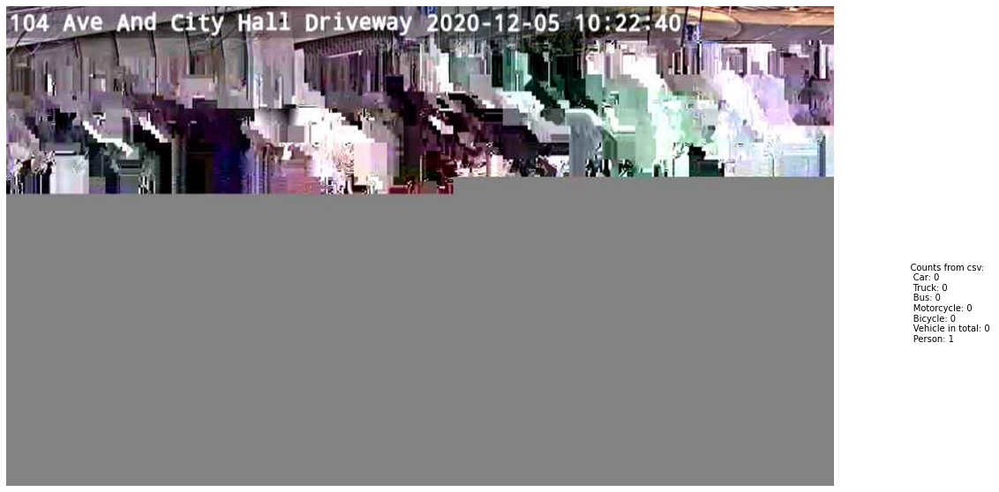

Using model: yolov3
2020-12-23-19-22-42-enc_104egress_cityhall_cam1.jpg


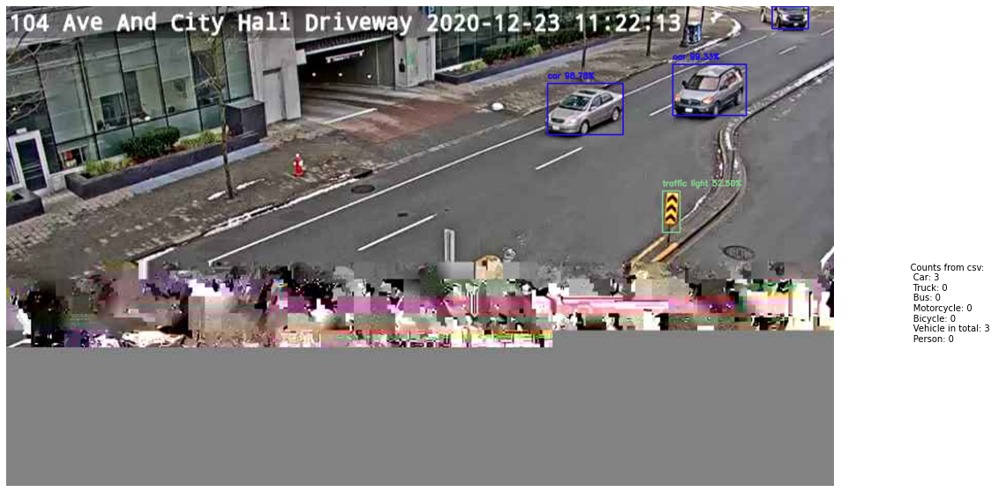

In [21]:
analyze_pic("2020-12-05-18-22-43-enc_104egress_cityhall_cam1.jpg", dir_cam=dir_cam2, df=df_dec2020, resize=True, write_conf=True, count_from_csv=True)
analyze_pic("2020-12-23-19-22-42-enc_104egress_cityhall_cam1.jpg", dir_cam=dir_cam2, df=df_dec2020, resize=True, write_conf=True, count_from_csv=True)

## Potential solutions:
- Change in object detection pipeline:
     - YOLOv3 -> YOLOv4 (tested later) 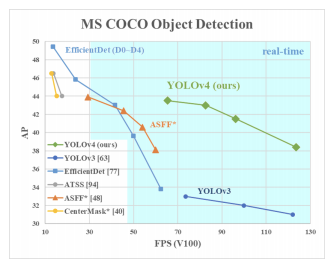
     - Modify the existing model for specific scenarios. For example, headlights/taillights as a dominant feature during nighttime (Panicker, 2013), low quality images ([Rajotte, 2018](https://www.researchgate.net/publication/330477122_Object_Counting_on_Low_Quality_Images_A_Case_Study_of_Near_Real-Time_Traffic_Monitoring)), high occulusion object counting ([Zhang, 2017](https://openaccess.thecvf.com/content_cvpr_2017/papers/Zhang_Understanding_Traffic_Density_CVPR_2017_paper.pdf))
     - Fine tune the model using labeled traffic cam data. (We would need them to be labeled by bounding boxes for each object category)
          
- Change in data processing.
    - Degradation of quality of data. For example, make binary (cars 59.6%, no cars 40.4%). 
    - A moving window which takes max to smooth out the counts. The data does not hallucinate.


**The current detection pipeline is (inconsistently) underestimating the traffic counts.**  

Does, and if so to what extent the issues here affect our analysis?   
If our goal is to give a qualitative evaluation of economic recovery, an approximation should suffice?   
If we need to correct for pref. sampling bias in the data using mathematical methods, it will affect the model precision?  
After all, how do we quantify these biases?  

# Testing SOTA: YOLOv4

Note: YOLOv4 results shown in slides are results from Darknet model (GPU enabled) pre-trained on COCO dataset.  
Confidence threshold and NMS threshold are the same with cvlib yolov3/v4.

[Code reference on Google Colab](https://colab.research.google.com/drive/1roOwzdyOvrMY8QBCm0-UwCyPb3K9u5YF#scrollTo=uRvm2x8OYZd3)

Using model: yolov4
2020-12-07-19-22-43-enc_104_140_cam1.jpg


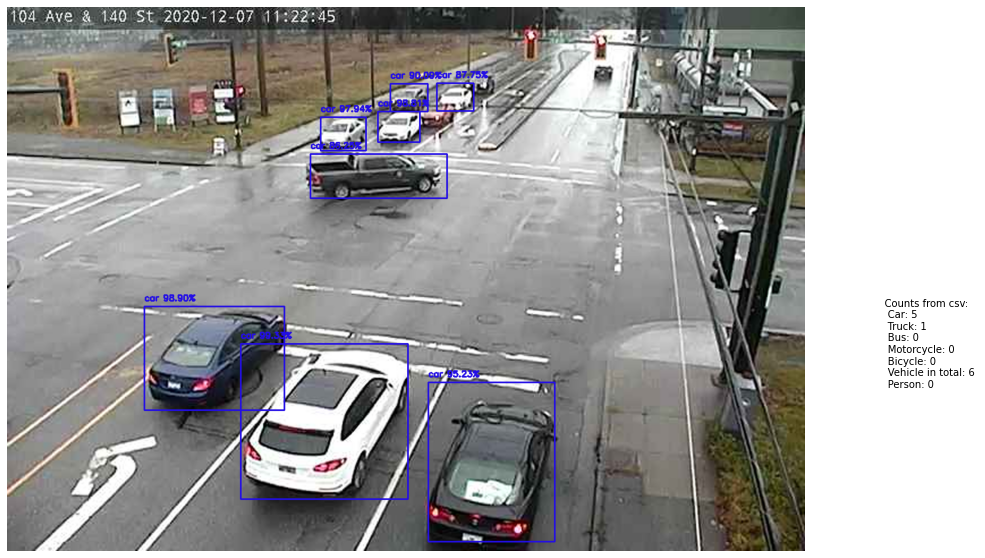

In [23]:
analyze_pic('2020-12-07-19-22-43-enc_104_140_cam1.jpg', dir_cam=dir_cam1, df=df_dec2020, model='yolov4', resize=True, write_conf=True, count_from_csv=True)

7 + 1 cars detected with high confidence using cvlib yolov4 in contrast to the csv record which states 5 + 1.